<a href="https://colab.research.google.com/github/jcdumlao14/Projects/blob/main/Exploring_Classic_Diamond_Dataset_with_PyCaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# "Exploring Classic Diamond Dataset  with PyCaret"

![image](https://5.imimg.com/data5/IG/PU/SI/SELLER-9932073/blue-diamonds-500x500.jpg)

Diamonds are precious stones that are highly valued for their exceptional beauty, rarity, and durability. They are formed from carbon that has been subjected to high pressure and temperature deep within the earth's mantle over millions of years. Diamonds are renowned for their luster, brilliance, and fire, which are determined by their cut, clarity, color, and carat weight. They are used in a variety of applications, including as gemstones for jewelry, industrial tools, and scientific equipment. Diamonds have also been associated with symbols of love and commitment, with the diamond engagement ring becoming a widely recognized symbol of romantic love in many cultures. In short, diamonds represent beauty, value, and endurance, and are considered one of the most precious and sought-after materials on earth.

# Introduction

Looking to delve into the fascinating world of diamond pricing? Look no further than the classic diamond dataset. With nearly 54,000 diamonds, this dataset offers a treasure trove of attributes to explore, from weight and cut to color and clarity. Whether you're just starting out in data analysis and visualization or looking to build on your existing skills, this dataset provides a perfect opportunity to learn and grow. By examining key factors such as price, carat weight, cut quality, color, clarity, and physical dimensions, you can uncover the intricate relationships between these variables and gain a deeper understanding of the factors that determine a diamond's value. Don't miss out on this exciting chance to explore one of the most complex and captivating markets in the world!

# Objectives

Objective: To explore and analyze the relationships between the different attributes of the classic diamond dataset, including price, carat weight, cut quality, color, clarity, and physical dimensions, and to gain a deeper understanding of how these variables influence each other and determine the value of a diamond. This objective is geared towards beginners in data analysis and visualization who want to develop their skills by working with this dataset.

|About Dataset|  |
|---------------|:--------------------|
|price | price in US dollars ($326--$18,823)|
|carat weight of the diamond (0.2--5.01)|Carat is a unit of weight used for measuring diamonds, with one carat equal to 0.2 grams.|
|cut quality of the cut (Fair, Good, Very Good, Premium, Ideal)|The quality of the cut of the diamond, which determines how well the diamond reflects light. The possible values are Fair, Good, Very Good, Premium, and Ideal, with Ideal being the highest quality.|
|color- diamond colour, from J (worst) to D (best)|The color of the diamond, with a range from J (worst) to D (best). The color scale is based on how yellow or brown the diamond appears to the naked eye.|
|clarity a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))| A measure of how clear the diamond is, ranging from I1 (worst) to IF (best). The clarity scale is based on the presence of inclusions and blemishes in the diamond.|
|x length in mm (0--10.74)| The length of the diamond in millimeters.|
|y width in mm (0--58.9)|The width of the diamond in millimeters.|
|z depth in mm (0--31.8)|The depth of the diamond in millimeters.|
|depth -total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)|The total depth percentage of the diamond, calculated as the depth divided by the mean of x and y, multiplied by 2.|
|table- width of top of diamond relative to widest point (43--95)| The width of the top of the diamond relative to the widest point, expressed as a percentage.|

# 1. Data Setup

# Installing pycaret

In [ ]:
%%capture
!pip install pycaret


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#For Data Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns



In [ ]:
class_df = pd.read_csv('/content/diamonds.csv')
class_df.drop(columns = 'Unnamed: 0', inplace =True)
class_df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


## **Data Analysis**

In [ ]:
class_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [ ]:
class_df.describe().T

,count,mean,std,min,25%,50%,75%,max
carat,53940.0,0.797940,0.474011,0.2,0.40,0.70,1.04,5.01
depth,53940.0,61.749405,1.432621,43.0,61.00,61.80,62.50,79.00
table,53940.0,57.457184,2.234491,43.0,56.00,57.00,59.00,95.00
price,53940.0,3932.799722,3989.439738,326.0,950.00,2401.00,5324.25,18823.00
x,53940.0,5.731157,1.121761,0.0,4.71,5.70,6.54,10.74
y,53940.0,5.734526,1.142135,0.0,4.72,5.71,6.54,58.90
z,53940.0,3.538734,0.705699,0.0,2.91,3.53,4.04,31.80


In [ ]:
#Checking for Null values
class_df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

## **Data visualization**





In [ ]:
import plotly.express as px
import pandas as pd

fig = px.scatter(class_df, x='carat', y='price', color='cut', hover_data=['color', 'clarity'])
fig.update_layout(height=500, width=800, title_text="Relationship Between Carat and Price by Cut")
fig.show()


In [ ]:
fig = px.scatter_matrix(class_df, dimensions=['carat', 'color',	'clarity','depth','table','price','x','y','z'], color='cut')
fig.update_layout(height=800, width=800, title_text="Scatter Matrix of Diamond Features by Cut")
fig.show()

In [ ]:
fig = px.box(class_df, x='cut', y='price', color='cut')
fig.update_layout(title_text="Box Plot of Diamond Prices by Cut Quality")
fig.show()

The plot shows a box plot of diamond prices by cut quality. The x-axis shows the different types of cut quality, while the y-axis represents the price of the diamonds. Each box in the plot represents the distribution of prices for each type of cut quality. The whiskers show the range of prices, and the dots represent the outliers.

From the plot, we can see that the premium cut quality has the highest median price, followed by the fair and good cut qualities. The Ideal cut quality has the smallest distribution of prices and the least amount of outliers. Overall, the plot shows that the cut quality has a significant impact on the price of diamonds, with the premium cut quality being the most expensive.

In [ ]:
fig = px.scatter(class_df, x="color", y="price", color="color",
                 labels={"color": "Diamond Color", "price": "Diamond Price"},
                 title="Diamond Price by Color")
fig.show()

Regression Line

In [ ]:
fig = px.scatter(class_df, x='carat', y='price', trendline='ols')
fig.show()


The resulting plot shows a positive correlation between the carat and price variables, with a trendline that provides an estimate of the relationship between the two variables.

In [ ]:
fig = px.scatter(class_df, x=['x', 'y', 'z', 'table', 'carat'], y='price', trendline='ols')
fig.update_layout(title_text="Regression Plot of Diamond Price by Length, Width, Depth, Table, and Carat")
fig.show()

Correlation Matrix

In [ ]:
corr_matrix = class_df.corr()
fig = px.imshow(corr_matrix)
fig.show()


The resulting plot shows a matrix of colored squares, where each square represents the correlation coefficient between two features in the diamonds dataset. Dark blue squares indicate a high positive correlation, while dark red squares indicate a high negative correlation. Squares that are close to light yellow indicate little or no correlation.

The diagonal of the matrix shows the correlation of each feature with itself, which is always 1.

# **2. Set up the Environment**

This step involves importing PyCaret and the necessary dataset, and initializing the environment using the setup() function. This function handles data preprocessing, feature engineering, and other important steps that prepare the data for modeling.

In [ ]:
%%capture
!pip install --pre pycaret

In [ ]:
import sys
sys.argv = [arg for arg in sys.argv if not arg.startswith("-f")]


In [ ]:
from pycaret import classification
from setuptools import setup

In [ ]:
from pycaret.regression import *

In [ ]:
mclf_setup = setup(data = class_df,  target = 'price')

,Description,Value
0,session_id,8800
1,Target,price
2,Original Data,"(53940, 10)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(37757, 26)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='price',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy='...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
              

In [ ]:
mclf_setup

('ff7f', Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='price',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='...
                 ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                 ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                 ('cluster_all', 'passthrough'),
                 ('dummy', Dummify(target='price')),
                 ('fix_perfect', Remove_100(target=

# **3. Compare Models**
 
Once the environment is set up, the compare_models() function is used to compare the performance of different machine learning models on the dataset.

In [ ]:
#%%capture
#!pip install numpy --upgrade

In [ ]:
compare_models(fold=5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,288.7636,3.038533e+05,551.0263,0.9807,0.1119,0.0854,0.454
et,Extra Trees Regressor,276.2113,3.128632e+05,559.1869,0.9801,0.0964,0.0691,10.566
rf,Random Forest Regressor,278.4467,3.185814e+05,564.2469,0.9798,0.0959,0.0686,13.510
gbr,Gradient Boosting Regressor,402.4747,5.411470e+05,735.5475,0.9656,0.2106,0.1287,3.560
dt,Decision Tree Regressor,372.4269,5.893251e+05,767.5358,0.9626,0.1294,0.0897,0.332
knn,K Neighbors Regressor,537.9866,1.013129e+06,1006.2275,0.9357,0.1961,0.1518,1.312
lasso,Lasso Regression,739.0706,1.275754e+06,1128.8807,0.9190,0.5831,0.3884,0.106
ridge,Ridge Regression,741.4695,1.292548e+06,1136.4010,0.9179,0.5905,0.3927,0.040
br,Bayesian Ridge,741.1710,1.292942e+06,1136.5697,0.9179,0.5920,0.3926,0.066
lr,Linear Regression,741.1012,1.293040e+06,1136.6115,0.9179,0.5924,0.3926,0.562


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
top3 = compare_models(n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,288.0510,3.020421e+05,549.0876,0.9808,0.1116,0.0853,0.472
et,Extra Trees Regressor,273.6957,3.102835e+05,556.7691,0.9803,0.0952,0.0681,12.190
rf,Random Forest Regressor,275.6293,3.147621e+05,560.5489,0.9800,0.0948,0.0675,14.870
gbr,Gradient Boosting Regressor,402.1589,5.411911e+05,735.3571,0.9656,0.2100,0.1284,3.765
dt,Decision Tree Regressor,364.8685,5.625560e+05,749.6959,0.9643,0.1292,0.0888,0.207
knn,K Neighbors Regressor,528.4204,9.783327e+05,988.8325,0.9379,0.1930,0.1493,0.721
lasso,Lasso Regression,739.0131,1.275167e+06,1128.4941,0.9190,0.5845,0.3884,0.122
lar,Least Angle Regression,741.0766,1.294417e+06,1136.9076,0.9178,0.5856,0.3925,0.031
br,Bayesian Ridge,741.1199,1.294222e+06,1136.8272,0.9178,0.5859,0.3924,0.057
ridge,Ridge Regression,741.3847,1.293876e+06,1136.6877,0.9178,0.5883,0.3925,0.025


INFO:logs:create_model_container: 36
INFO:logs:master_model_container: 36
INFO:logs:display_container: 3
INFO:logs:[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
              

In PyCaret, compare_models is a function used for model selection and tuning. By default, compare_models runs and compares performance of all models available in PyCaret's model library.

The n_select parameter in compare_models specifies the number of top performing models to select based on a chosen performance metric. In the code you provided, n_select = 3 means that the function will select the top three performing models based on the default performance metric, which is Accuracy for classification tasks and R2 for regression tasks.

The selected top three models are then stored in the top3 variable, which can be used for further model evaluation or ensemble building.

In [ ]:
top3

[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
 ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                     max_depth=None, max_features='auto', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0,
                     min_impurity_split=None, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=8800, verbose=0, warm_start=False),
 RandomForestRegressor(bootstrap=True, ccp_alpha

# **4. Create a Model**

After comparing different models, the create_model() function is used to create the model that will be used for making predictions. This function takes the name of the desired model as an argument.

In [ ]:
lightgbm_model=create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,282.4762,292855.2831,541.1611,0.9815,0.1117,0.0835
1,293.5068,368647.5056,607.1635,0.9769,0.1128,0.0852
2,288.3204,306491.3117,553.6166,0.9805,0.1065,0.0831
3,288.9726,305774.0909,552.9684,0.9803,0.1138,0.0868
4,289.3294,291897.1862,540.2751,0.9814,0.1125,0.0871
5,295.5501,320350.6251,565.9953,0.9794,0.1092,0.0851
6,284.7904,263633.0559,513.4521,0.9830,0.1153,0.0863
7,278.7562,285995.9771,534.7859,0.9805,0.1113,0.0852
8,289.3107,292636.8194,540.9592,0.9822,0.1092,0.0845


INFO:logs:create_model_container: 38
INFO:logs:master_model_container: 38
INFO:logs:display_container: 5
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
%%capture
!pip install fairlearn

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=X_test)
INFO:logs:Global variable: X_test returned as        carat      depth  table     x     y     z  cut_Fair  cut_Good  \
38726   0.40  62.299999   54.0  4.75  4.76  2.96       0.0       0.0   
31640   0.25  60.099998   62.0  4.08  4.11  2.46       0.0       0.0   
32572   0.40  61.500000   58.0  4.73  4.76  2.92       0.0       0.0   
53819   0.71  62.500000   60.0  5.70  5.66  3.55       0.0       0.0   
2994    0.90  63.799999   55.0  6.07  6.16  3.90       0.0       1.0   
...      ...        ...    ...   ...   ...   ...       ...       ...   
43488   0.58  60.900002   57.0  5.38  5.33  3.26       0.0       0.0   
37947   0.28  63.000000   59.0  4.11  4.15  2.60       0.0       0.0   
29549   0.36  61.299999   55.0  4.62  4.64  2.84       0.0       0.0   
6733    0.31  62.599998   56.0  4.33  4.36  2.72       0.0       0.0   
30246   0.26  63.299999   57.0  4.07  4.05  2.57       0.0       0.0   

       cut_Idea

,Samples,MAE,MSE,RMSE,R2,RMSLE,MAPE
price,,,,,,,
326,1.0,215.942484,4.663116e+04,4.663116e+04,NaN,0.507043,0.662400
334,1.0,132.574782,1.757607e+04,1.757607e+04,NaN,0.333429,0.396930
335,1.0,23.484976,5.515441e+02,5.515441e+02,NaN,0.067561,0.070104
336,2.0,74.075458,6.898683e+03,6.898683e+03,0.0,0.217976,0.220463
337,1.0,162.808562,2.650663e+04,2.650663e+04,NaN,0.393178,0.483111
...,...,...,...,...,...,...,...
18757,1.0,1345.020987,1.809081e+06,1.809081e+06,NaN,0.074404,0.071708
18779,1.0,1572.489972,2.472725e+06,2.472725e+06,NaN,0.087447,0.083737
18780,1.0,2383.158487,5.679444e+06,5.679444e+06,NaN,0.135696,0.126899


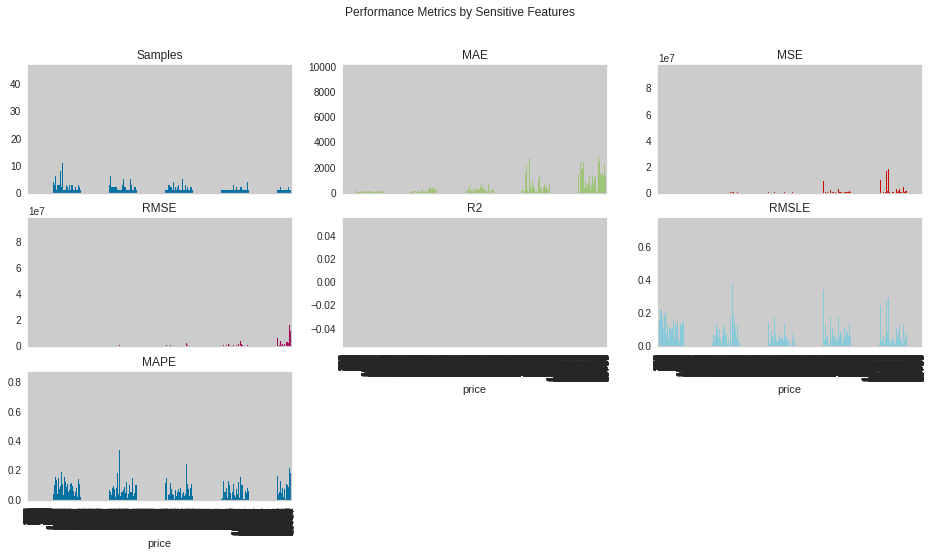

In [ ]:
# check fairness
check_fairness(lightgbm_model, sensitive_features= ['price'])

The following are some common evaluation metrics used in regression models:

1. MAE (Mean Absolute Error): It measures the average magnitude of the errors in a set of predictions, without considering their direction. It is calculated by taking the absolute differences between the predicted values and the actual values and then averaging them.

2. MSE (Mean Squared Error): It measures the average of the squared differences between the predicted values and the actual values. It gives a higher weight to large errors than to small ones.

3. RMSE (Root Mean Squared Error): It is the square root of the MSE and gives an estimate of the standard deviation of the residuals. It is also in the same unit as the target variable, which makes it easier to interpret.

4. R2 (Coefficient of Determination): It measures how well the regression line fits the actual data. It ranges from 0 to 1, where 1 means a perfect fit.

5. RMSLE (Root Mean Squared Log Error): It is similar to RMSE but applies the logarithm function to the predicted and actual values first. This is useful when the target variable has a large range of values.

6. MAPE (Mean Absolute Percentage Error): It measures the average absolute percentage difference between the predicted values and the actual values. It is useful when the target variable has a wide range of values and you want to evaluate the performance of the model in terms of relative error.






# **5. Tune the Model**

To improve the performance of the model, the tune_model() function can be used to optimize the hyperparameters of the model.

In [ ]:
%%capture
!pip install scikit-optimize

In [ ]:
import numpy as np
from scipy.optimize import least_squares
from scipy.optimize import minimize
from scipy.optimize import fmin
import matplotlib.pyplot as plt

In [ ]:
tuned_lightgbm_model=tune_model(lightgbm_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,292.2961,322697.7237,568.0649,0.9796,0.1121,0.0812
1,299.3613,402254.9133,634.2357,0.9748,0.1118,0.0820
2,295.2846,322247.2603,567.6683,0.9795,0.1096,0.0830
3,297.0260,346978.7703,589.0490,0.9777,0.1230,0.0872
4,297.0630,322385.2578,567.7898,0.9794,0.1129,0.0853
5,302.1388,342547.4260,585.2755,0.9780,0.1105,0.0840
6,289.1372,286903.8305,535.6340,0.9815,0.1662,0.0850
7,280.8021,310654.6574,557.3640,0.9788,0.1138,0.0832
8,296.4619,322087.7536,567.5278,0.9805,0.1155,0.0840


INFO:logs:create_model_container: 39
INFO:logs:master_model_container: 39
INFO:logs:display_container: 6
INFO:logs:LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


# **6. Plot Model Performance**

The plot_model() function can be used to visualize the performance of the model on the training set.

## a. Validation Curve

Validation Curve - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

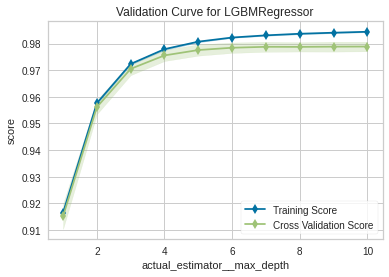

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'vc')

## **b. Recursive Feature Selection**

Recursive Feature Selection - It is a technique to select the most important features for a model by recursively removing the least important features.

In [ ]:
plot_model(tuned_lightgbm_model, plot = 'rfe')

## **c. Feature Importance**

Feature Importance - It is a plot that shows the importance of each feature for a model.

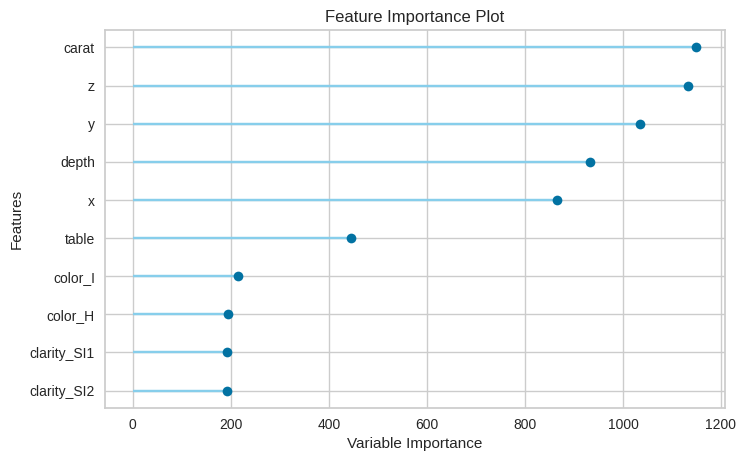

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'feature')

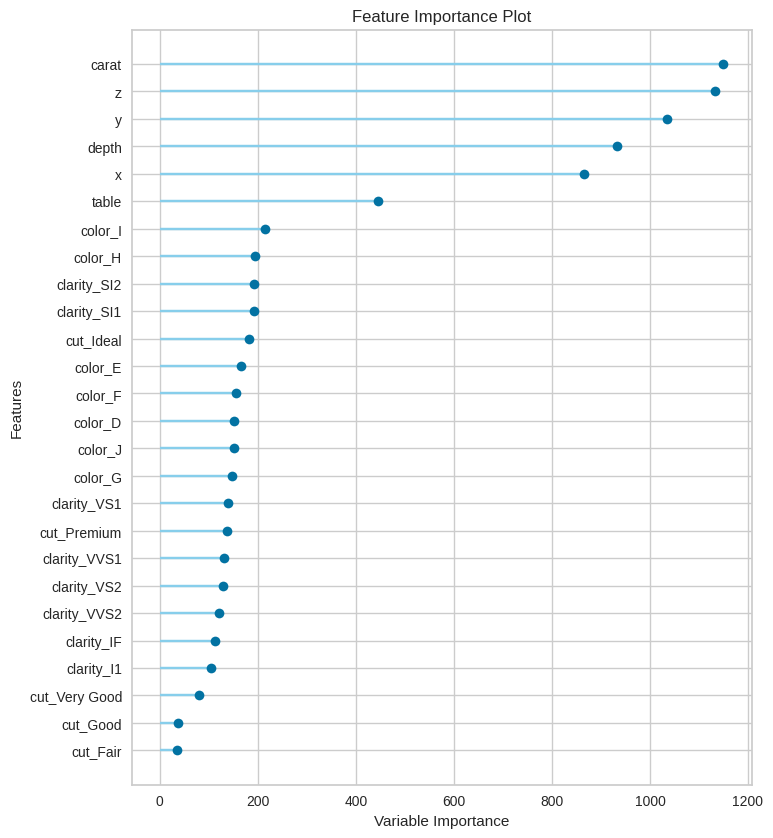

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'feature_all')

## **d. Learning Curve**

Learning Curve - It is a plot that shows the performance of the model on the training and validation sets for different sample sizes.

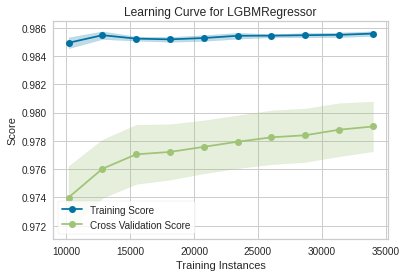

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'learning')

## **e. Model Hyperparameter**

Model Hyperparameter - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

In [ ]:
plot_model(tuned_lightgbm_model, plot = 'parameter')

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.1
max_depth,-1
min_child_samples,61
min_child_weight,0.001
min_split_gain,0.1
n_estimators,170


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


We use `create_model()` to train a lightgbm model on the dataset. Finally, we pass the trained model to `interpret_model()` to generate interpretation plots.

In [ ]:
%%capture
!pip install shap

In [ ]:
%matplotlib

Using matplotlib backend: agg


In [ ]:
lightgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,282.4762,292855.2831,541.1611,0.9815,0.1117,0.0835
1,293.5068,368647.5056,607.1635,0.9769,0.1128,0.0852
2,288.3204,306491.3117,553.6166,0.9805,0.1065,0.0831
3,288.9726,305774.0909,552.9684,0.9803,0.1138,0.0868
4,289.3294,291897.1862,540.2751,0.9814,0.1125,0.0871
5,295.5501,320350.6251,565.9953,0.9794,0.1092,0.0851
6,284.7904,263633.0559,513.4521,0.9830,0.1153,0.0863
7,278.7562,285995.9771,534.7859,0.9805,0.1113,0.0852
8,289.3107,292636.8194,540.9592,0.9822,0.1092,0.0845


INFO:logs:create_model_container: 40
INFO:logs:master_model_container: 40
INFO:logs:display_container: 7
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
from pycaret.classification import *
from pycaret.regression import *

## f. Interpret the Model

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=8800, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


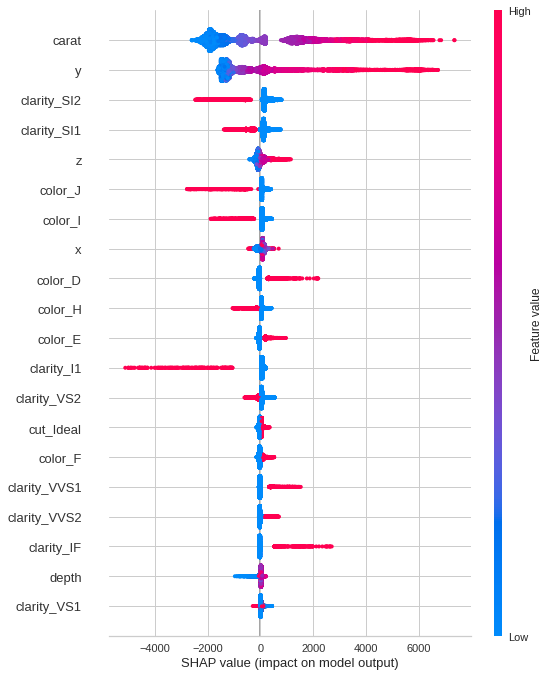

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(lightgbm)

The function interpret_model( ) only supports tree-based models for binary classification, specifically `et`, `rf`, `lightgbm`, and `dt`.

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


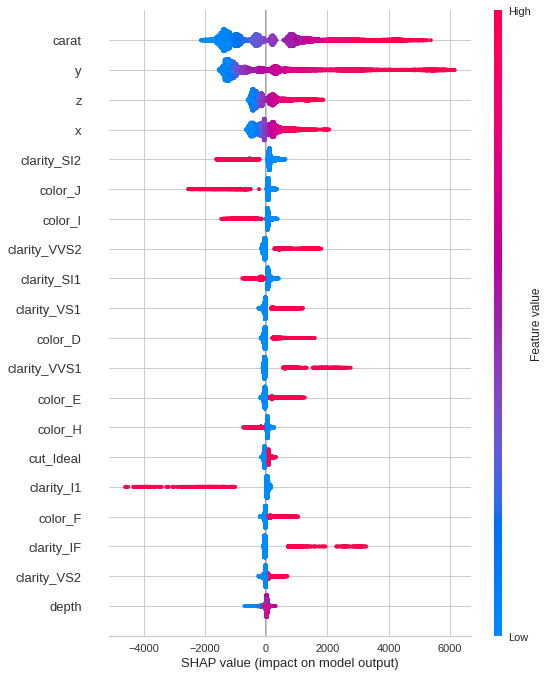

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_lightgbm_model)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=correlation, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: correlation
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: type 2


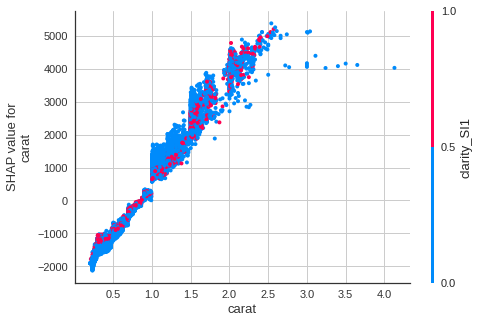

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_lightgbm_model,plot='correlation')

# **7. Evaluate Model**

The evaluate_model() function is used to evaluate the performance of the model on the test set.

In [ ]:
evaluate_model(tuned_lightgbm_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **8. Finalize Model**

After the model has been evaluated, the finalize_model() function can be used to finalize the model for deployment.

In [ ]:
final_lightgbm = finalize_model(tuned_lightgbm_model)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fit_kwargs=None, groups=None, model_only=True, display=None, experiment_custom_tags=None, return_train_score=False)
INFO:logs:Finalizing LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61

In [ ]:
final_lightgbm

LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

# **9. Predict Model**

Finally, the predict_model() function is used to make predictions on new data using the finalized model.

In [ ]:
predict_model(tuned_lightgbm_model)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,297.672,336332.567,579.9419,0.9793,0.114,0.0828


,carat,depth,table,x,y,z,cut_Fair,cut_Good,cut_Ideal,cut_Premium,...,clarity_I1,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,price,Label
0,0.40,62.299999,54.0,4.75,4.76,2.96,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1043,1083.897005
1,0.25,60.099998,62.0,4.08,4.11,2.46,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,450,509.022563
2,0.40,61.500000,58.0,4.73,4.76,2.92,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,800,1088.613378
3,0.71,62.500000,60.0,5.70,5.66,3.55,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2735,2855.663629
4,0.90,63.799999,55.0,6.07,6.16,3.90,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3303,3328.706294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16178,0.58,60.900002,57.0,5.38,5.33,3.26,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1421,1500.786522
16179,0.28,63.000000,59.0,4.11,4.15,2.60,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,487,564.794722
16180,0.36,61.299999,55.0,4.62,4.64,2.84,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,705,711.001597
16181,0.31,62.599998,56.0,4.33,4.36,2.72,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,578,631.808521


# **10. Save Model**

In [ ]:
save_model(tuned_lightgbm_model,'lightgbm_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=LGBMRegressor(bagging_fraction=0.8, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.1,
              n_estimators=170, n_jobs=-1, num_leaves=50, objective=None,
              random_state=8800, reg_alpha=0.05, reg_lambda=0.2, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), model_name=lightgbm_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='price',
                       

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='price',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='...
                                colsample_bytree=1.0, feature_fraction=0.5,
                                importance_type='split', learning_rate=0.1,
                                max_depth=-1, min_child_samples=61,
                                min_child_weight=0.001, min_split_gain=0.1,
                 

In [ ]:
!ls

diamonds.csv  lightgbm_model.pkl  logs.log  sample_data


In [ ]:
from pycaret.regression import load_model

In [ ]:
load_lightgbm = load_model('lightgbm_model')

INFO:logs:Initializing load_model()
INFO:logs:load_model(model_name=lightgbm_model, platform=None, authentication=None, verbose=True)


Transformation Pipeline and Model Successfully Loaded


In [ ]:
load_lightgbm

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='price',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy='...
                               colsample_bytree=1.0, feature_fraction=0.5,
                               importance_type='split', learning_rate=0.1,
                               max_depth=-1, min_child_samples=61,
                               min_child_weight=0.001, min_split_gain=0.1,
                               n_